# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
# data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

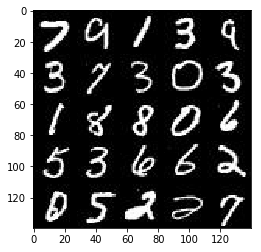

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

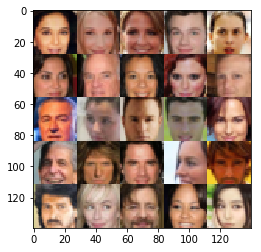

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_input_images = tf.placeholder(tf.float32, shape=(None, image_width, image_height, image_channels))
    z_data = tf.placeholder(tf.float32, shape=(None, z_dim))
    learning_rate = tf.placeholder(tf.float32)
    return real_input_images, z_data, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [62]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    alpha = 0.1
    leaky_relu = lambda x: tf.maximum(alpha * x, x)
    layer = images # 28x28x[1|3]
#     if reuse:
#         keep_prob = tf.constant(1.0)
#     else:
#         keep_prob = tf.constant(0.4)
    
    with tf.variable_scope('discriminator', reuse=reuse):
        # Convolutions
        layer = tf.layers.conv2d(layer, 64, 5, strides=2, padding='same')
        layer = leaky_relu(layer)
        for filter_size in [128, 256]:
            layer = tf.layers.conv2d(layer, filter_size, 5, strides=2, padding='same')
#             if filter_size == 256:
#                 layer = tf.layers.batch_normalization(layer, training=(not reuse))
            layer = leaky_relu(layer)
#             layer = tf.nn.dropout(layer, keep_prob)
        # Flatten output and compute logits
        layer = tf.reshape(layer, (-1, 4*4*256))
        logits = tf.layers.dense(layer, 1)
        # Probability
        prob = tf.sigmoid(logits)

    return prob, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [63]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha = 0.1
    leaky_relu = lambda x: tf.maximum(alpha * x, x)
    
    with tf.variable_scope('generator', reuse=not is_train):
        # Reshape to start convolutions
        layer = tf.layers.dense(z, 3*3*512)
        layer = tf.reshape(layer, (-1, 3, 3, 512))
        layer = tf.layers.batch_normalization(layer, training=is_train)
        layer = leaky_relu(layer)
        # Transposed convolutions
        for filter_size, strides in zip([256, 128], [2, 2]):
            layer = tf.layers.conv2d_transpose(layer, filter_size, 5, strides=strides, padding='same')
            layer = tf.layers.batch_normalization(layer, training=is_train)
            layer = leaky_relu(layer)
        # Transposed convolution without batch_norm and activation
        layer = tf.layers.conv2d_transpose(layer, out_channel_dim, 6, strides=2, padding='valid')
        # Output squashed between -1 and 1
        output = tf.tanh(layer)
    
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [47]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    smooth = 0.1
    # Forward passes to generate fake image and real/fake logits
    input_fake = generator(input_z, out_channel_dim, is_train=True)
    prob_real, logits_real = discriminator(input_real, reuse=False)
    prob_fake, logits_fake = discriminator(input_fake, reuse=True)
    # Discriminator's loss
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_real, labels=tf.ones_like(logits_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_fake, labels=tf.zeros_like(logits_fake)))
    d_loss = d_loss_real + d_loss_fake
    # Generator's loss    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_fake, labels=tf.ones_like(logits_fake)))
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    trainable_variables = tf.trainable_variables()
    d_variables = [v for v in trainable_variables if v.name.startswith('discriminator')]
    g_variables = [v for v in trainable_variables if v.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_optimizer = tf.train.AdamOptimizer(learning_rate, beta1).minimize(d_loss, var_list=d_variables)
        g_optimizer = tf.train.AdamOptimizer(learning_rate, beta1).minimize(g_loss, var_list=g_variables)
    
    return d_optimizer, g_optimizer


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [64]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    out_channel_dim = len(data_image_mode)
    steps = 0
    
    real_images, z, lr = model_inputs(28, 28, out_channel_dim, z_dim)
    d_loss, g_loss = model_loss(real_images, z, out_channel_dim)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # Rescale images to range (-1, 1)
                batch_images *= 2
                # Sample for z
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                # Run optimizers
#                 _ = sess.run(g_opt, feed_dict={real_images: batch_images, 
#                                                z: batch_z, 
#                                                lr: learning_rate})
                _ = sess.run(d_opt, feed_dict={real_images: batch_images, 
                                               z: batch_z, 
                                               lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={real_images: batch_images, 
                                               z: batch_z, 
                                               lr: learning_rate})
                # Monitor losses
                if steps % 20 == 0:
                    d_train_loss = sess.run(d_loss, feed_dict={real_images: batch_images,
                                                               z: batch_z,
                                                               lr: learning_rate})
                    g_train_loss = sess.run(g_loss, feed_dict={real_images: batch_images,
                                                               z: batch_z,
                                                               lr: learning_rate})
                    print('Epoch {}/{}  '.format(epoch_i+1, epoch_count),
                          'Step {}\t'.format(steps),
                          'Discriminator loss: {:.4f}\t'.format(d_train_loss),
                          'Generator loss: {:.4f}\t'.format(g_train_loss))
                # Monitor fake images
#                 if steps % 100 == 0:
                    show_generator_output(sess, 25, z, out_channel_dim, data_image_mode)
                steps += 1
        
        # Show last step's result
        show_generator_output(sess, 36, z, out_channel_dim, data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2   Step 0	 Discriminator loss: 1.4092	 Generator loss: 0.5292	


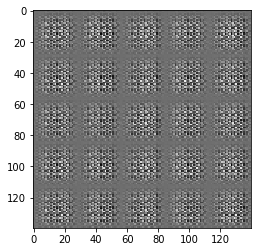

Epoch 1/2   Step 20	 Discriminator loss: 1.2099	 Generator loss: 0.9404	


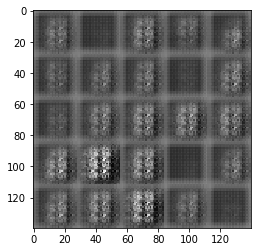

Epoch 1/2   Step 40	 Discriminator loss: 1.0551	 Generator loss: 1.0065	


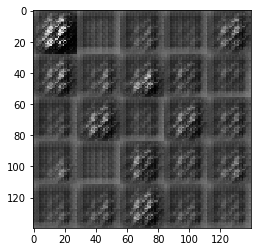

Epoch 1/2   Step 60	 Discriminator loss: 1.4279	 Generator loss: 0.5349	


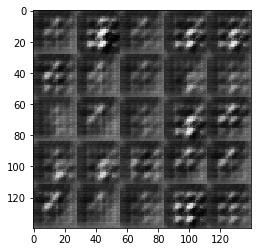

Epoch 1/2   Step 80	 Discriminator loss: 1.2420	 Generator loss: 1.0403	


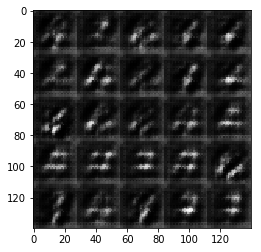

Epoch 1/2   Step 100	 Discriminator loss: 1.2909	 Generator loss: 0.8715	


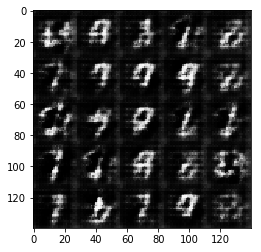

Epoch 1/2   Step 120	 Discriminator loss: 1.3561	 Generator loss: 1.3400	


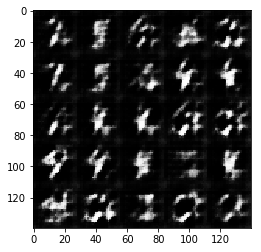

Epoch 1/2   Step 140	 Discriminator loss: 1.3175	 Generator loss: 0.7870	


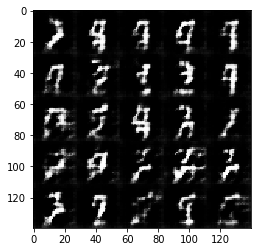

Epoch 1/2   Step 160	 Discriminator loss: 1.2953	 Generator loss: 0.9490	


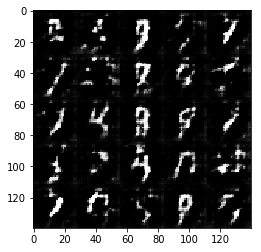

Epoch 1/2   Step 180	 Discriminator loss: 1.2222	 Generator loss: 1.0137	


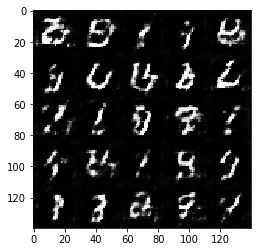

Epoch 1/2   Step 200	 Discriminator loss: 1.2660	 Generator loss: 0.9182	


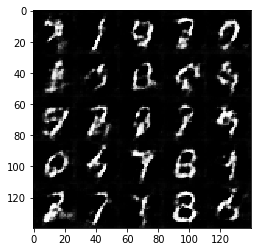

Epoch 1/2   Step 220	 Discriminator loss: 1.2904	 Generator loss: 0.7861	


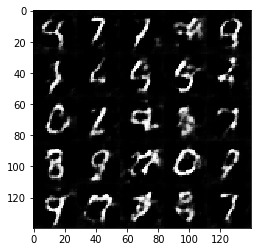

Epoch 1/2   Step 240	 Discriminator loss: 1.2841	 Generator loss: 0.9641	


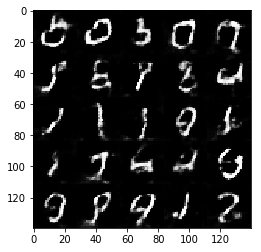

Epoch 1/2   Step 260	 Discriminator loss: 1.2724	 Generator loss: 0.9746	


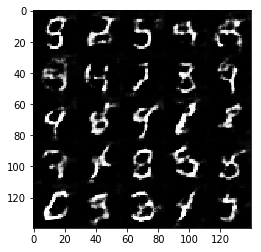

Epoch 1/2   Step 280	 Discriminator loss: 1.2163	 Generator loss: 1.0056	


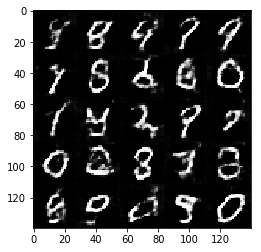

Epoch 1/2   Step 300	 Discriminator loss: 1.3467	 Generator loss: 0.6795	


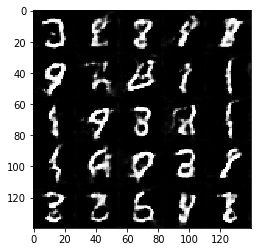

Epoch 1/2   Step 320	 Discriminator loss: 1.2850	 Generator loss: 0.8218	


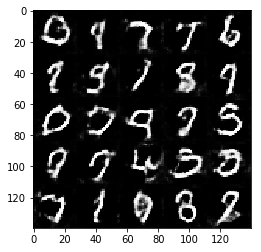

Epoch 1/2   Step 340	 Discriminator loss: 1.2633	 Generator loss: 1.0352	


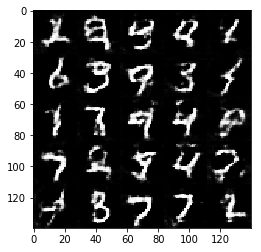

Epoch 1/2   Step 360	 Discriminator loss: 1.2859	 Generator loss: 0.9012	


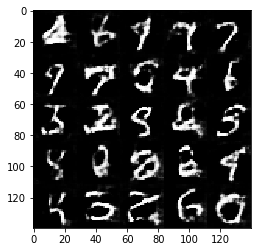

Epoch 1/2   Step 380	 Discriminator loss: 1.3021	 Generator loss: 0.8567	


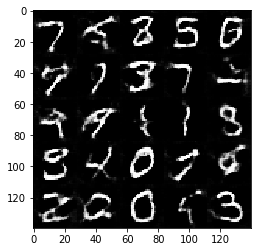

Epoch 1/2   Step 400	 Discriminator loss: 1.2446	 Generator loss: 1.1185	


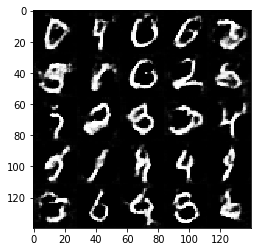

Epoch 1/2   Step 420	 Discriminator loss: 1.3475	 Generator loss: 0.6540	


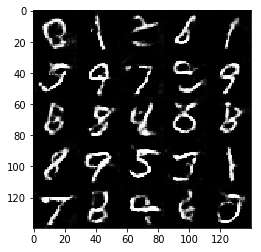

Epoch 1/2   Step 440	 Discriminator loss: 1.3057	 Generator loss: 0.9206	


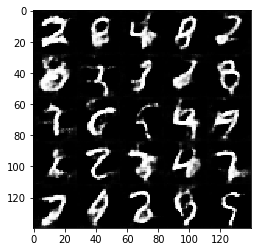

Epoch 1/2   Step 460	 Discriminator loss: 1.2181	 Generator loss: 0.9116	


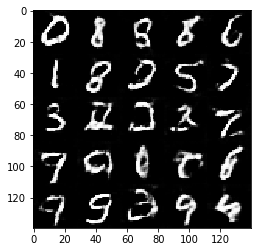

Epoch 1/2   Step 480	 Discriminator loss: 1.3368	 Generator loss: 1.4458	


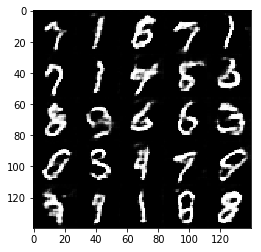

Epoch 1/2   Step 500	 Discriminator loss: 1.2427	 Generator loss: 1.1099	


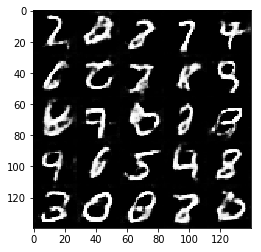

Epoch 1/2   Step 520	 Discriminator loss: 1.2449	 Generator loss: 0.9116	


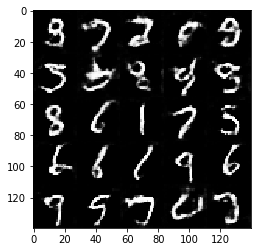

Epoch 1/2   Step 540	 Discriminator loss: 1.2525	 Generator loss: 1.0059	


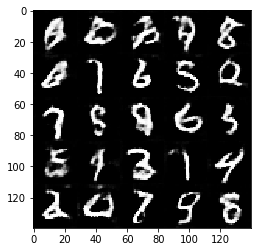

Epoch 1/2   Step 560	 Discriminator loss: 1.2401	 Generator loss: 0.9557	


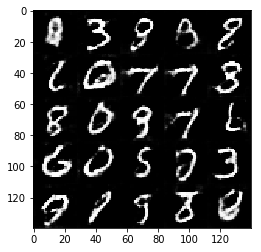

Epoch 1/2   Step 580	 Discriminator loss: 1.2593	 Generator loss: 0.8457	


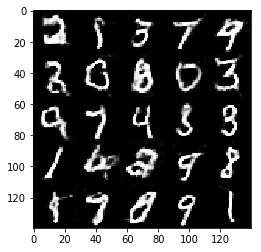

Epoch 1/2   Step 600	 Discriminator loss: 1.1823	 Generator loss: 1.0234	


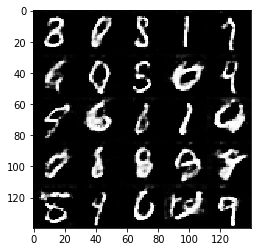

Epoch 1/2   Step 620	 Discriminator loss: 1.2730	 Generator loss: 1.2425	


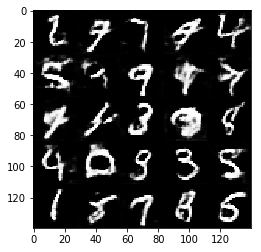

Epoch 1/2   Step 640	 Discriminator loss: 1.3160	 Generator loss: 0.7331	


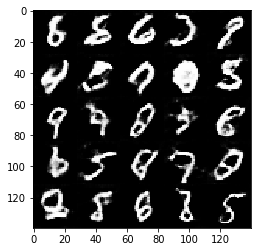

Epoch 1/2   Step 660	 Discriminator loss: 1.1918	 Generator loss: 1.0484	


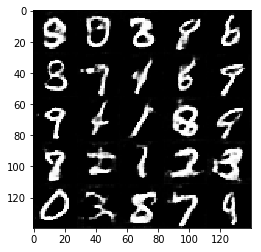

Epoch 1/2   Step 680	 Discriminator loss: 1.2384	 Generator loss: 0.9906	


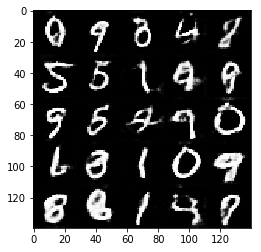

Epoch 1/2   Step 700	 Discriminator loss: 1.2314	 Generator loss: 0.9319	


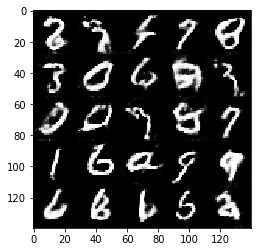

Epoch 1/2   Step 720	 Discriminator loss: 1.2605	 Generator loss: 1.0259	


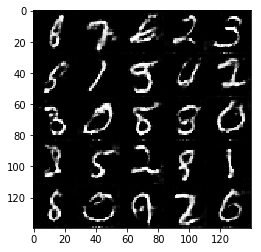

Epoch 1/2   Step 740	 Discriminator loss: 1.2230	 Generator loss: 1.0383	


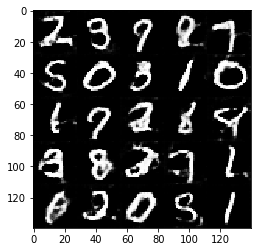

Epoch 1/2   Step 760	 Discriminator loss: 1.2258	 Generator loss: 1.1152	


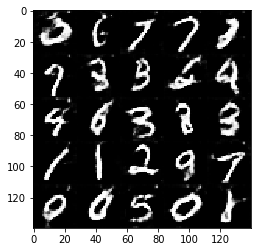

Epoch 1/2   Step 780	 Discriminator loss: 1.2727	 Generator loss: 0.8462	


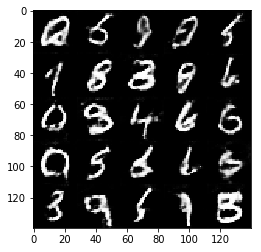

Epoch 1/2   Step 800	 Discriminator loss: 1.2146	 Generator loss: 0.8989	


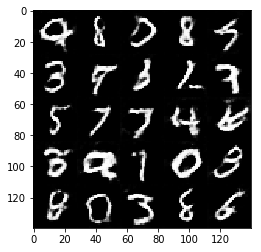

Epoch 1/2   Step 820	 Discriminator loss: 1.2944	 Generator loss: 0.9736	


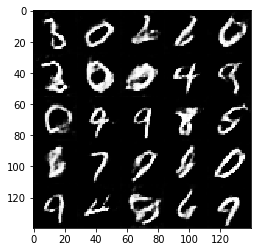

Epoch 1/2   Step 840	 Discriminator loss: 1.2261	 Generator loss: 0.9425	


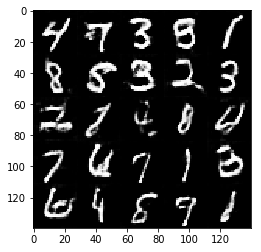

Epoch 1/2   Step 860	 Discriminator loss: 1.3107	 Generator loss: 0.8619	


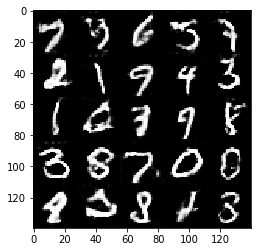

Epoch 1/2   Step 880	 Discriminator loss: 1.1913	 Generator loss: 0.9870	


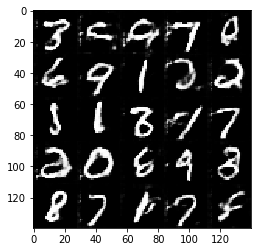

Epoch 1/2   Step 900	 Discriminator loss: 1.2154	 Generator loss: 0.8644	


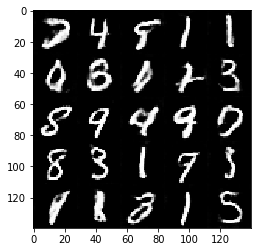

Epoch 1/2   Step 920	 Discriminator loss: 1.2675	 Generator loss: 0.8840	


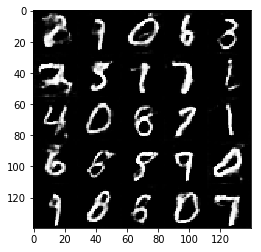

Epoch 2/2   Step 940	 Discriminator loss: 1.2570	 Generator loss: 0.7514	


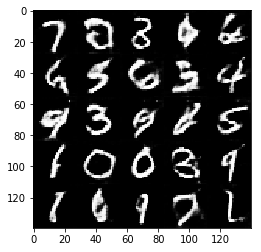

Epoch 2/2   Step 960	 Discriminator loss: 1.2565	 Generator loss: 0.8216	


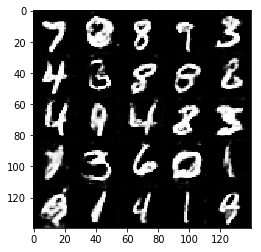

Epoch 2/2   Step 980	 Discriminator loss: 1.3925	 Generator loss: 0.6570	


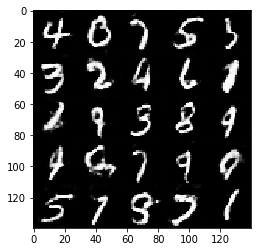

Epoch 2/2   Step 1000	 Discriminator loss: 1.1551	 Generator loss: 1.0502	


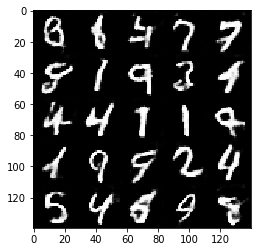

Epoch 2/2   Step 1020	 Discriminator loss: 1.2034	 Generator loss: 0.9284	


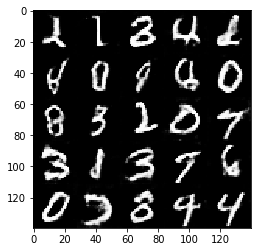

Epoch 2/2   Step 1040	 Discriminator loss: 1.2243	 Generator loss: 0.8661	


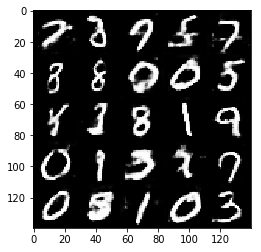

Epoch 2/2   Step 1060	 Discriminator loss: 1.1986	 Generator loss: 0.9644	


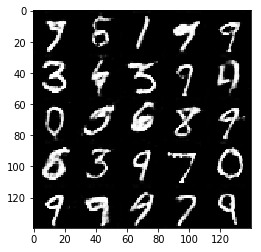

Epoch 2/2   Step 1080	 Discriminator loss: 1.1800	 Generator loss: 1.2594	


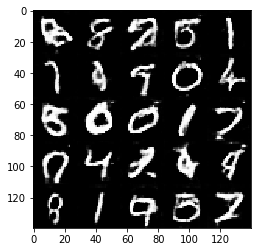

Epoch 2/2   Step 1100	 Discriminator loss: 1.1849	 Generator loss: 0.9191	


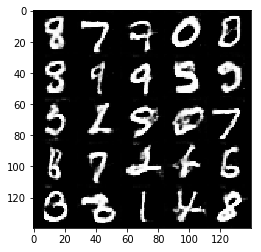

Epoch 2/2   Step 1120	 Discriminator loss: 1.1983	 Generator loss: 0.9150	


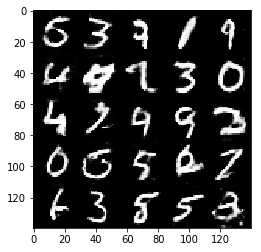

Epoch 2/2   Step 1140	 Discriminator loss: 1.2425	 Generator loss: 1.0242	


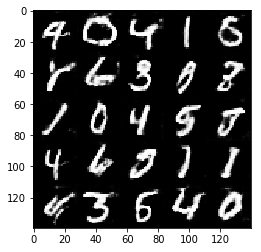

Epoch 2/2   Step 1160	 Discriminator loss: 1.2033	 Generator loss: 1.0575	


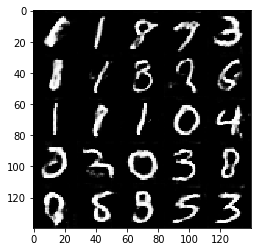

Epoch 2/2   Step 1180	 Discriminator loss: 1.2007	 Generator loss: 0.9501	


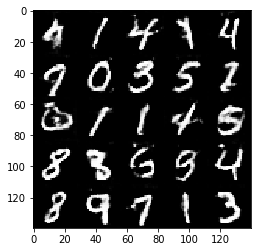

Epoch 2/2   Step 1200	 Discriminator loss: 1.3081	 Generator loss: 0.7886	


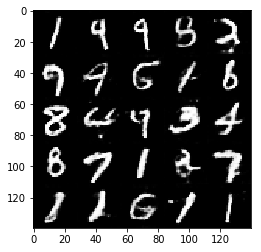

Epoch 2/2   Step 1220	 Discriminator loss: 1.3362	 Generator loss: 1.8698	


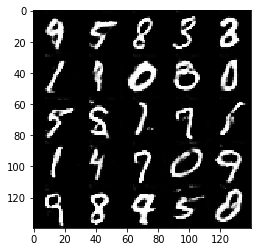

Epoch 2/2   Step 1240	 Discriminator loss: 1.0363	 Generator loss: 1.4093	


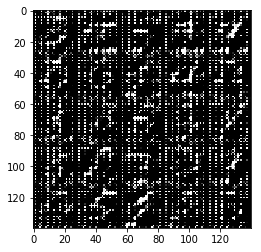

Epoch 2/2   Step 1260	 Discriminator loss: 1.3196	 Generator loss: 0.9753	


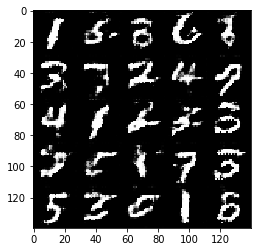

Epoch 2/2   Step 1280	 Discriminator loss: 1.2905	 Generator loss: 0.9007	


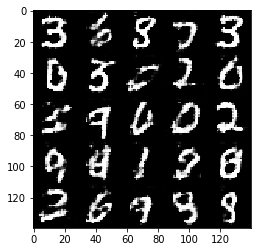

In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1   Step 0	 Discriminator loss: 1.4798	 Generator loss: 0.5058	


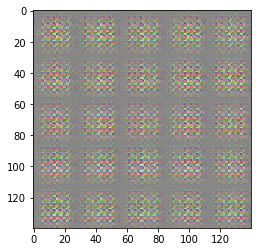

Epoch 1/1   Step 20	 Discriminator loss: 1.1771	 Generator loss: 0.9865	


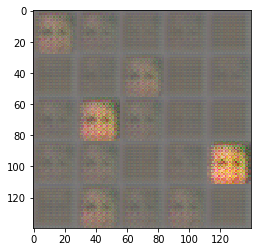

Epoch 1/1   Step 40	 Discriminator loss: 1.1537	 Generator loss: 0.9996	


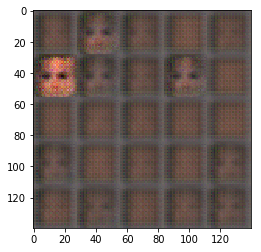

Epoch 1/1   Step 60	 Discriminator loss: 1.0794	 Generator loss: 1.1312	


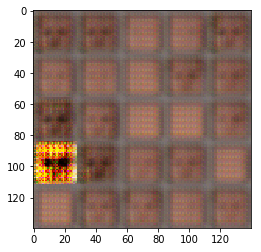

Epoch 1/1   Step 80	 Discriminator loss: 1.6295	 Generator loss: 0.5099	


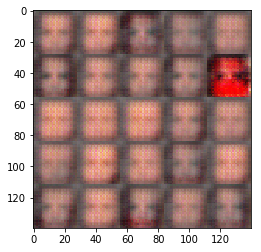

Epoch 1/1   Step 100	 Discriminator loss: 1.1721	 Generator loss: 1.3237	


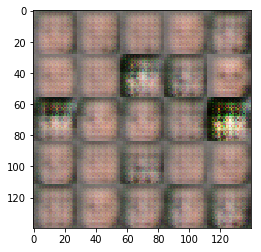

Epoch 1/1   Step 120	 Discriminator loss: 1.1272	 Generator loss: 1.4982	


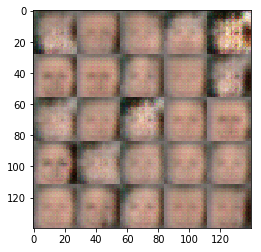

Epoch 1/1   Step 140	 Discriminator loss: 1.1825	 Generator loss: 1.1438	


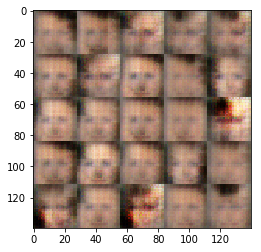

Epoch 1/1   Step 160	 Discriminator loss: 1.0782	 Generator loss: 1.8605	


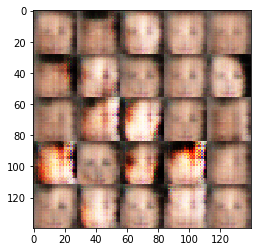

Epoch 1/1   Step 180	 Discriminator loss: 1.0647	 Generator loss: 1.4602	


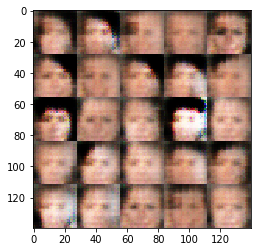

Epoch 1/1   Step 200	 Discriminator loss: 1.1742	 Generator loss: 1.0708	


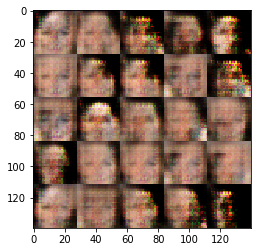

Epoch 1/1   Step 220	 Discriminator loss: 0.7279	 Generator loss: 3.5784	


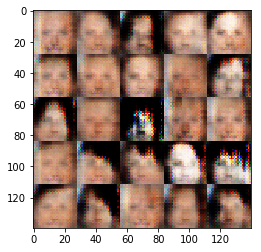

Epoch 1/1   Step 240	 Discriminator loss: 1.1589	 Generator loss: 1.1840	


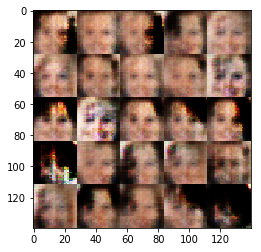

Epoch 1/1   Step 260	 Discriminator loss: 1.1846	 Generator loss: 1.2772	


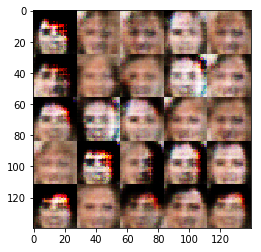

Epoch 1/1   Step 280	 Discriminator loss: 1.2395	 Generator loss: 0.9030	


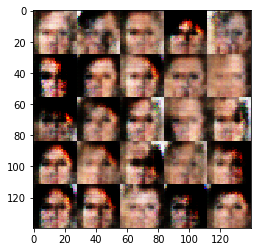

Epoch 1/1   Step 300	 Discriminator loss: 1.1229	 Generator loss: 1.1760	


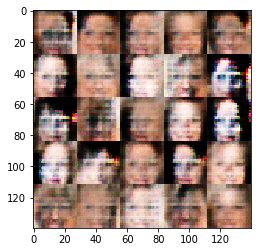

Epoch 1/1   Step 320	 Discriminator loss: 1.1371	 Generator loss: 0.9812	


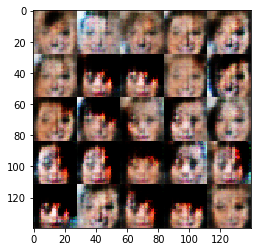

Epoch 1/1   Step 340	 Discriminator loss: 1.1675	 Generator loss: 1.1173	


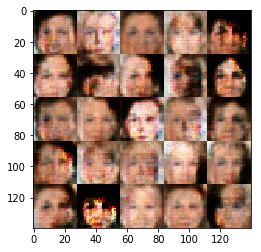

Epoch 1/1   Step 360	 Discriminator loss: 1.1775	 Generator loss: 1.1499	


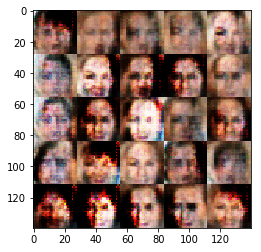

Epoch 1/1   Step 380	 Discriminator loss: 1.2113	 Generator loss: 0.9680	


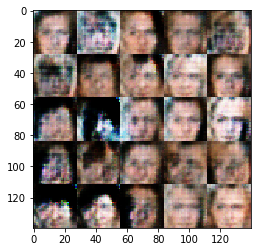

Epoch 1/1   Step 400	 Discriminator loss: 1.2360	 Generator loss: 0.8788	


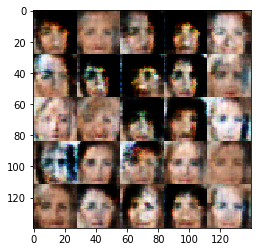

Epoch 1/1   Step 420	 Discriminator loss: 1.5140	 Generator loss: 0.6010	


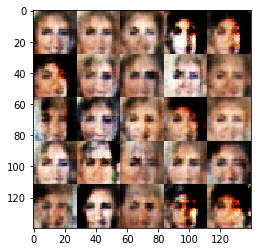

Epoch 1/1   Step 440	 Discriminator loss: 1.2103	 Generator loss: 1.2494	


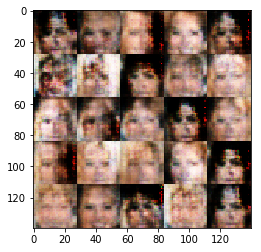

Epoch 1/1   Step 460	 Discriminator loss: 1.2192	 Generator loss: 0.9720	


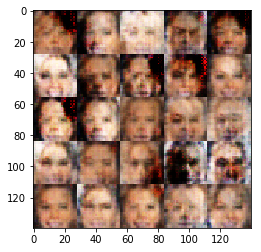

Epoch 1/1   Step 480	 Discriminator loss: 1.1924	 Generator loss: 1.1138	


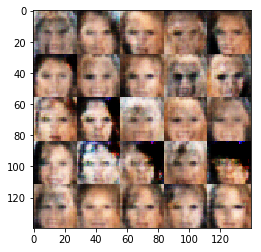

Epoch 1/1   Step 500	 Discriminator loss: 1.1812	 Generator loss: 1.1344	


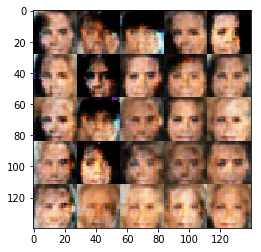

Epoch 1/1   Step 520	 Discriminator loss: 1.1576	 Generator loss: 1.3542	


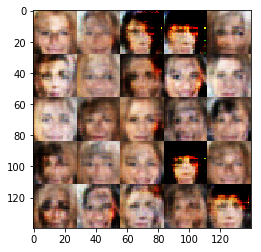

Epoch 1/1   Step 540	 Discriminator loss: 1.3543	 Generator loss: 1.8933	


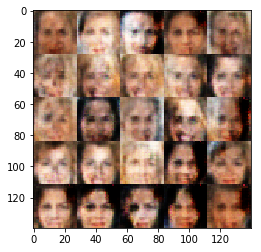

Epoch 1/1   Step 560	 Discriminator loss: 1.2545	 Generator loss: 0.8449	


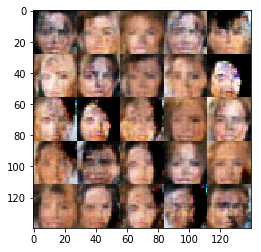

Epoch 1/1   Step 580	 Discriminator loss: 1.1297	 Generator loss: 1.2271	


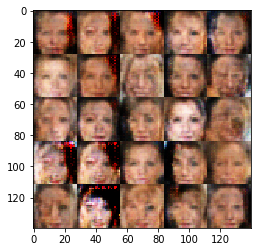

Epoch 1/1   Step 600	 Discriminator loss: 1.1557	 Generator loss: 1.1945	


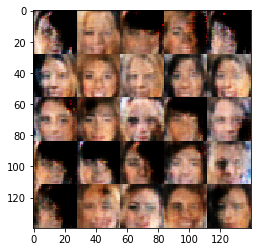

Epoch 1/1   Step 620	 Discriminator loss: 1.1434	 Generator loss: 1.1764	


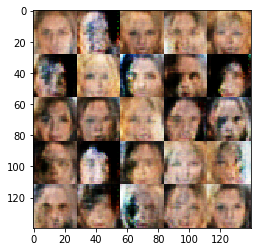

Epoch 1/1   Step 640	 Discriminator loss: 1.1457	 Generator loss: 0.9828	


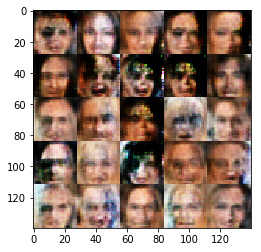

Epoch 1/1   Step 660	 Discriminator loss: 1.2533	 Generator loss: 0.8297	


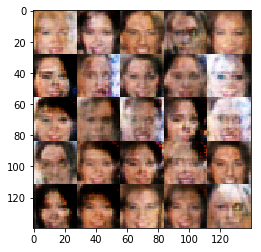

Epoch 1/1   Step 680	 Discriminator loss: 1.1131	 Generator loss: 1.5543	


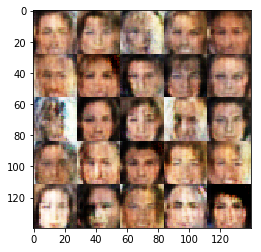

Epoch 1/1   Step 700	 Discriminator loss: 1.2509	 Generator loss: 0.9966	


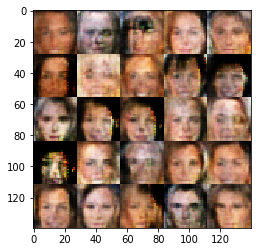

Epoch 1/1   Step 720	 Discriminator loss: 1.1120	 Generator loss: 1.5946	


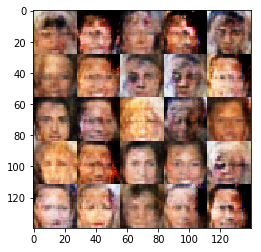

Epoch 1/1   Step 740	 Discriminator loss: 1.1648	 Generator loss: 1.3007	


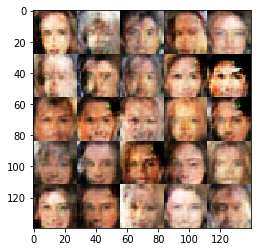

Epoch 1/1   Step 760	 Discriminator loss: 1.0615	 Generator loss: 1.2261	


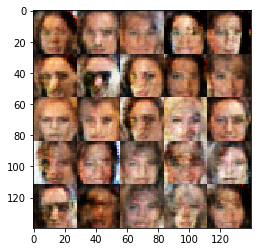

Epoch 1/1   Step 780	 Discriminator loss: 1.2069	 Generator loss: 0.9459	


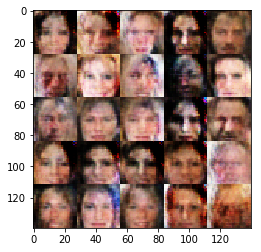

Epoch 1/1   Step 800	 Discriminator loss: 1.2597	 Generator loss: 1.5642	


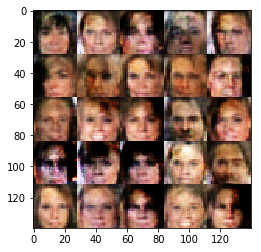

Epoch 1/1   Step 820	 Discriminator loss: 1.2483	 Generator loss: 0.8524	


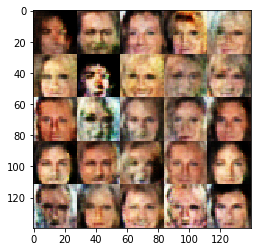

Epoch 1/1   Step 840	 Discriminator loss: 1.2009	 Generator loss: 0.9487	


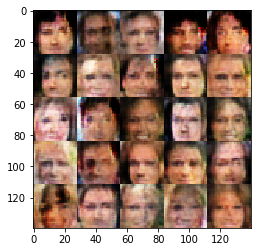

Epoch 1/1   Step 860	 Discriminator loss: 1.0995	 Generator loss: 1.3238	


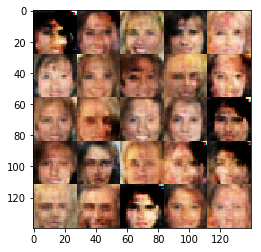

Epoch 1/1   Step 880	 Discriminator loss: 1.1796	 Generator loss: 1.1581	


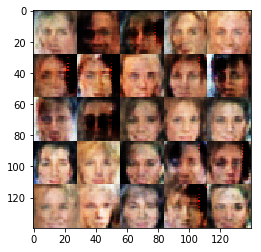

Epoch 1/1   Step 900	 Discriminator loss: 1.2225	 Generator loss: 0.9114	


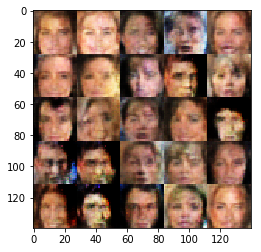

Epoch 1/1   Step 920	 Discriminator loss: 1.1991	 Generator loss: 1.4441	


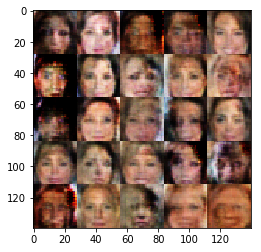

Epoch 1/1   Step 940	 Discriminator loss: 1.0690	 Generator loss: 1.3100	


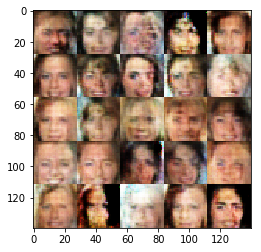

Epoch 1/1   Step 960	 Discriminator loss: 1.2246	 Generator loss: 1.0407	


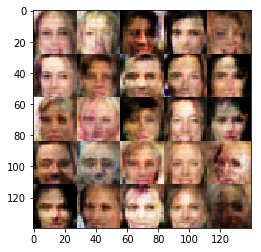

Epoch 1/1   Step 980	 Discriminator loss: 1.2616	 Generator loss: 0.8028	


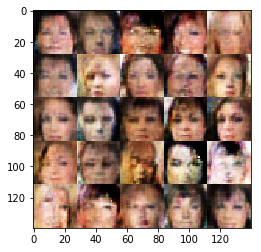

Epoch 1/1   Step 1000	 Discriminator loss: 1.3355	 Generator loss: 0.6877	


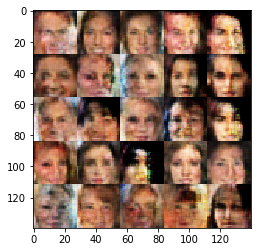

Epoch 1/1   Step 1020	 Discriminator loss: 1.1562	 Generator loss: 1.1625	


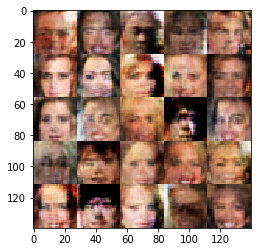

Epoch 1/1   Step 1040	 Discriminator loss: 1.1546	 Generator loss: 1.2868	


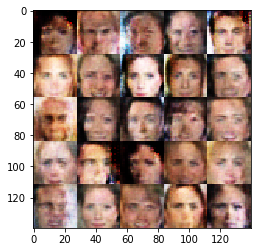

Epoch 1/1   Step 1060	 Discriminator loss: 1.3924	 Generator loss: 0.6098	


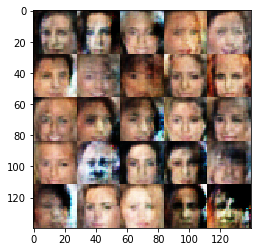

Epoch 1/1   Step 1080	 Discriminator loss: 1.1464	 Generator loss: 1.1377	


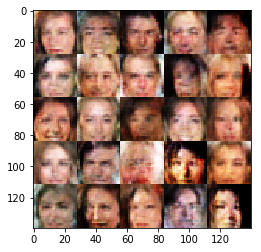

Epoch 1/1   Step 1100	 Discriminator loss: 1.2222	 Generator loss: 0.9804	


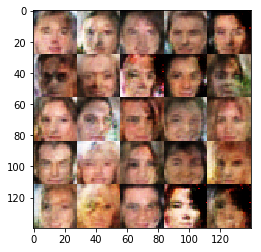

Epoch 1/1   Step 1120	 Discriminator loss: 1.2534	 Generator loss: 0.8133	


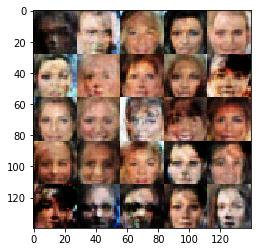

Epoch 1/1   Step 1140	 Discriminator loss: 1.7061	 Generator loss: 0.4641	


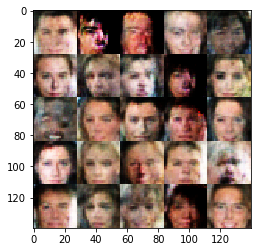

Epoch 1/1   Step 1160	 Discriminator loss: 1.1571	 Generator loss: 1.3598	


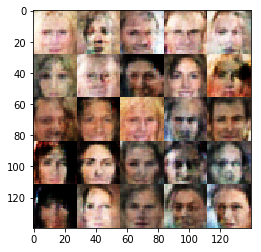

Epoch 1/1   Step 1180	 Discriminator loss: 1.1519	 Generator loss: 1.3882	


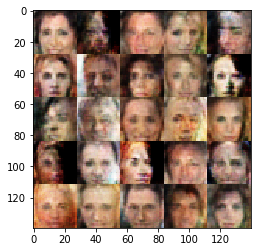

Epoch 1/1   Step 1200	 Discriminator loss: 1.2723	 Generator loss: 0.8190	


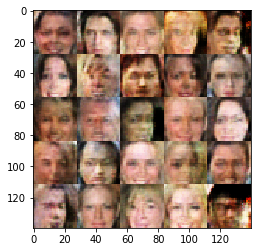

Epoch 1/1   Step 1220	 Discriminator loss: 1.1318	 Generator loss: 1.1880	


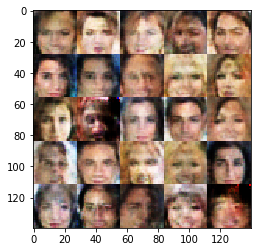

Epoch 1/1   Step 1240	 Discriminator loss: 1.1946	 Generator loss: 1.0390	


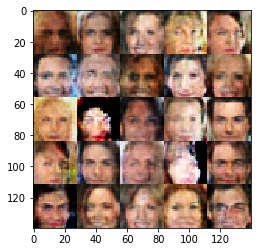

Epoch 1/1   Step 1260	 Discriminator loss: 1.1528	 Generator loss: 1.3914	


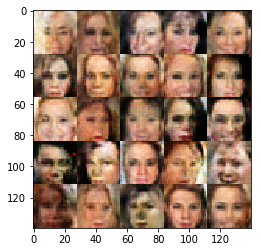

Epoch 1/1   Step 1280	 Discriminator loss: 1.1509	 Generator loss: 1.3281	


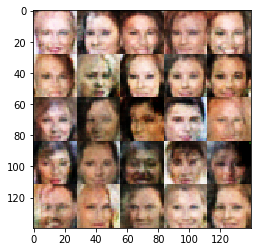

Epoch 1/1   Step 1300	 Discriminator loss: 1.1881	 Generator loss: 0.9251	


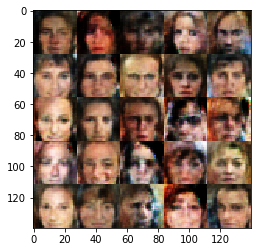

Epoch 1/1   Step 1320	 Discriminator loss: 1.1435	 Generator loss: 1.1638	


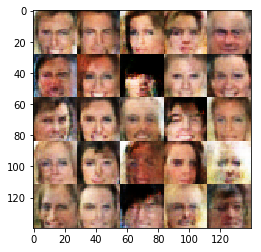

Epoch 1/1   Step 1340	 Discriminator loss: 1.1709	 Generator loss: 0.9881	


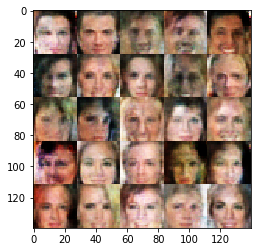

Epoch 1/1   Step 1360	 Discriminator loss: 1.1690	 Generator loss: 1.1180	


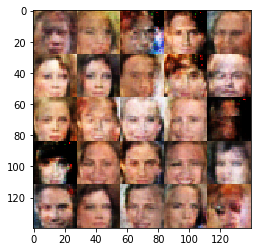

Epoch 1/1   Step 1380	 Discriminator loss: 1.1887	 Generator loss: 0.9533	


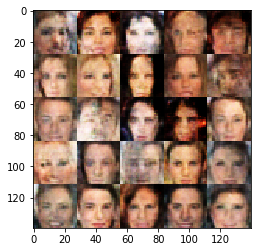

Epoch 1/1   Step 1400	 Discriminator loss: 1.2238	 Generator loss: 1.7454	


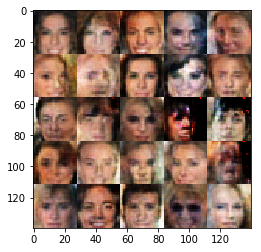

Epoch 1/1   Step 1420	 Discriminator loss: 1.3315	 Generator loss: 0.7061	


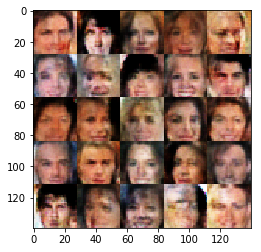

Epoch 1/1   Step 1440	 Discriminator loss: 1.2635	 Generator loss: 0.7583	


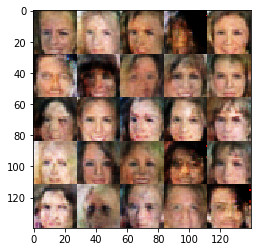

Epoch 1/1   Step 1460	 Discriminator loss: 1.5047	 Generator loss: 1.6687	


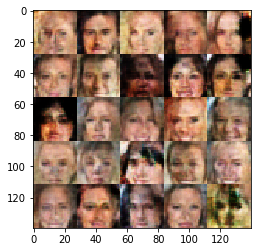

Epoch 1/1   Step 1480	 Discriminator loss: 1.0795	 Generator loss: 3.3323	


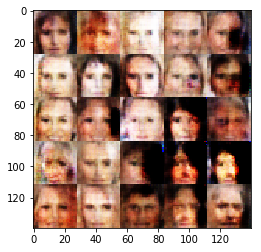

Epoch 1/1   Step 1500	 Discriminator loss: 1.1335	 Generator loss: 1.0913	


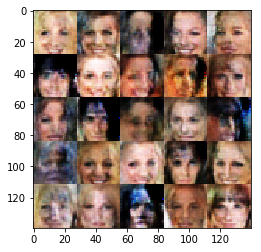

Epoch 1/1   Step 1520	 Discriminator loss: 1.0372	 Generator loss: 1.4938	


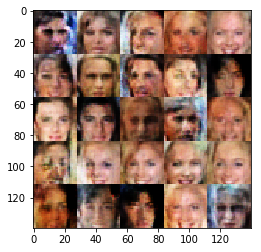

Epoch 1/1   Step 1540	 Discriminator loss: 1.0620	 Generator loss: 1.6367	


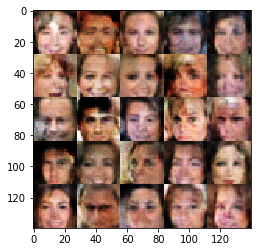

Epoch 1/1   Step 1560	 Discriminator loss: 1.2214	 Generator loss: 1.2753	


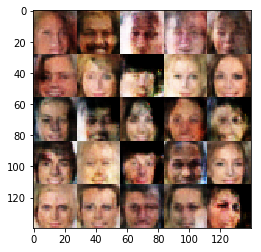

Epoch 1/1   Step 1580	 Discriminator loss: 1.2016	 Generator loss: 0.9806	


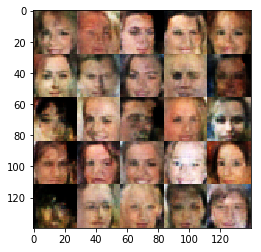

Epoch 1/1   Step 1600	 Discriminator loss: 1.1468	 Generator loss: 1.3557	


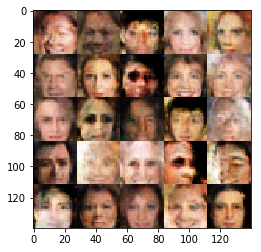

Epoch 1/1   Step 1620	 Discriminator loss: 1.1681	 Generator loss: 1.1710	


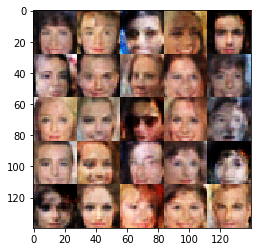

Epoch 1/1   Step 1640	 Discriminator loss: 1.1961	 Generator loss: 0.9975	


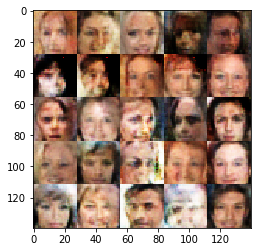

Epoch 1/1   Step 1660	 Discriminator loss: 1.1664	 Generator loss: 0.9134	


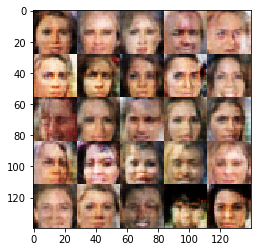

Epoch 1/1   Step 1680	 Discriminator loss: 1.3032	 Generator loss: 0.7475	


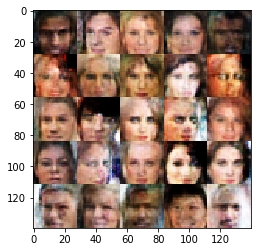

Epoch 1/1   Step 1700	 Discriminator loss: 1.0865	 Generator loss: 1.5767	


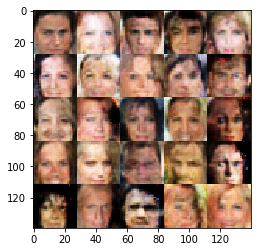

Epoch 1/1   Step 1720	 Discriminator loss: 1.0424	 Generator loss: 1.5096	


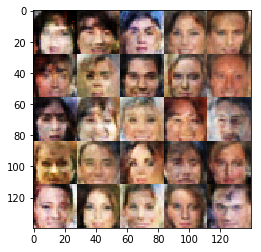

Epoch 1/1   Step 1740	 Discriminator loss: 1.2095	 Generator loss: 0.9924	


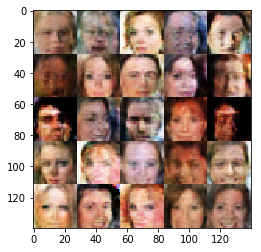

Epoch 1/1   Step 1760	 Discriminator loss: 1.2283	 Generator loss: 0.9769	


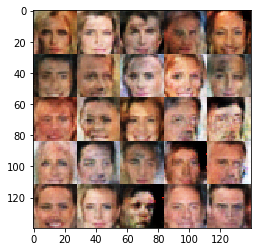

Epoch 1/1   Step 1780	 Discriminator loss: 1.2032	 Generator loss: 1.5837	


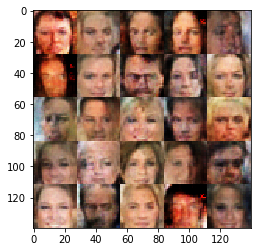

Epoch 1/1   Step 1800	 Discriminator loss: 1.2372	 Generator loss: 0.9704	


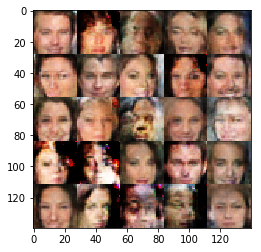

Epoch 1/1   Step 1820	 Discriminator loss: 1.0740	 Generator loss: 1.4775	


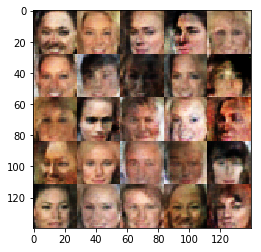

Epoch 1/1   Step 1840	 Discriminator loss: 1.2257	 Generator loss: 0.8283	


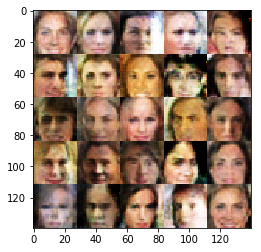

Epoch 1/1   Step 1860	 Discriminator loss: 1.1638	 Generator loss: 1.3300	


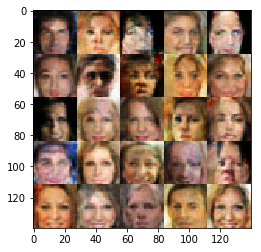

Epoch 1/1   Step 1880	 Discriminator loss: 1.2184	 Generator loss: 1.1470	


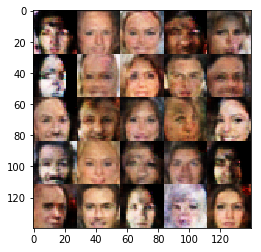

Epoch 1/1   Step 1900	 Discriminator loss: 1.1986	 Generator loss: 0.8379	


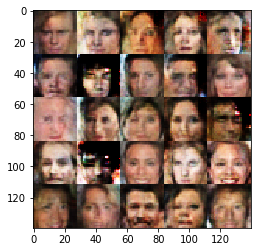

Epoch 1/1   Step 1920	 Discriminator loss: 1.2155	 Generator loss: 1.1078	


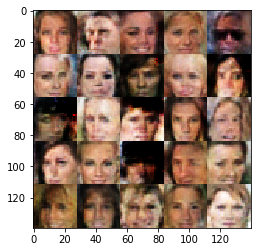

Epoch 1/1   Step 1940	 Discriminator loss: 1.3615	 Generator loss: 0.6467	


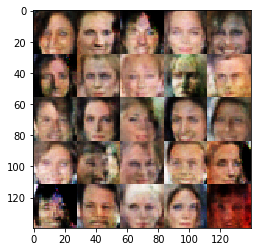

Epoch 1/1   Step 1960	 Discriminator loss: 1.1474	 Generator loss: 1.0396	


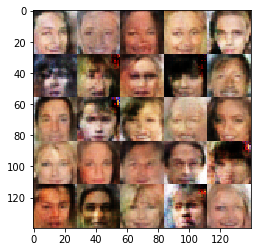

Epoch 1/1   Step 1980	 Discriminator loss: 1.3640	 Generator loss: 2.2958	


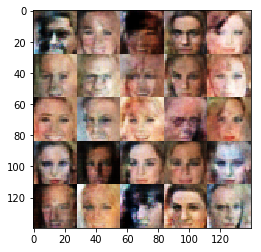

Epoch 1/1   Step 2000	 Discriminator loss: 1.0744	 Generator loss: 1.4132	


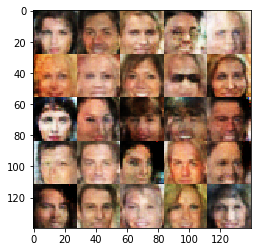

Epoch 1/1   Step 2020	 Discriminator loss: 1.1192	 Generator loss: 0.9427	


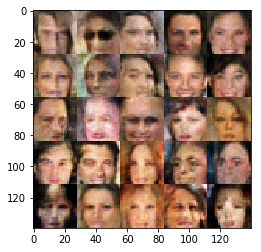

Epoch 1/1   Step 2040	 Discriminator loss: 1.2307	 Generator loss: 0.9103	


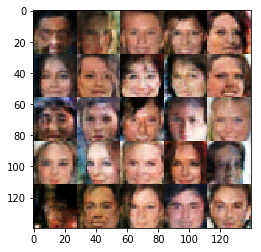

Epoch 1/1   Step 2060	 Discriminator loss: 1.2674	 Generator loss: 0.7527	


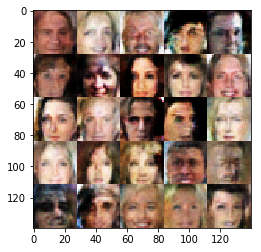

Epoch 1/1   Step 2080	 Discriminator loss: 1.4025	 Generator loss: 0.6244	


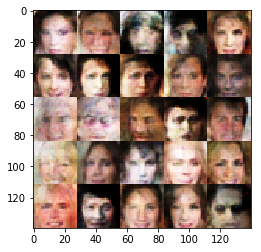

Epoch 1/1   Step 2100	 Discriminator loss: 1.2465	 Generator loss: 0.9361	


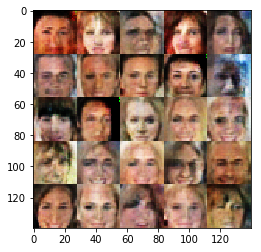

Epoch 1/1   Step 2120	 Discriminator loss: 1.0291	 Generator loss: 1.2411	


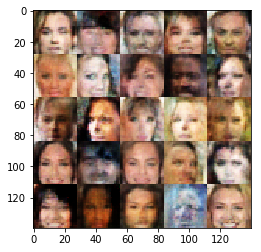

Epoch 1/1   Step 2140	 Discriminator loss: 1.0926	 Generator loss: 1.1352	


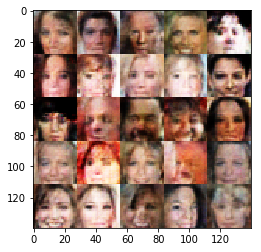

Epoch 1/1   Step 2160	 Discriminator loss: 1.2508	 Generator loss: 0.8607	


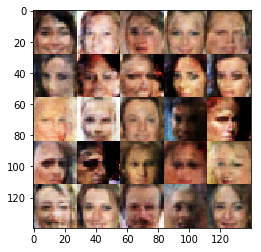

Epoch 1/1   Step 2180	 Discriminator loss: 1.2088	 Generator loss: 0.9947	


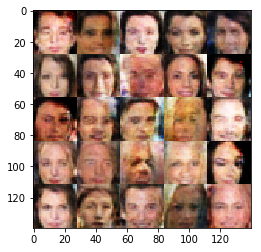

Epoch 1/1   Step 2200	 Discriminator loss: 1.1985	 Generator loss: 0.8297	


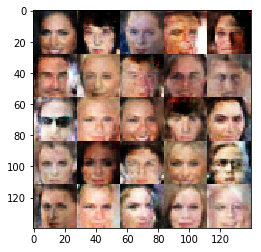

Epoch 1/1   Step 2220	 Discriminator loss: 1.1492	 Generator loss: 1.6254	


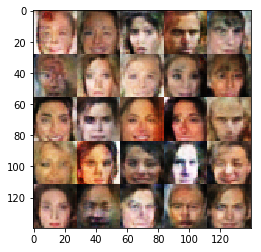

Epoch 1/1   Step 2240	 Discriminator loss: 1.2273	 Generator loss: 0.9124	


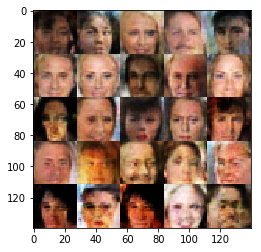

Epoch 1/1   Step 2260	 Discriminator loss: 1.2273	 Generator loss: 0.9186	


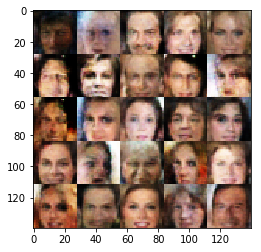

Epoch 1/1   Step 2280	 Discriminator loss: 1.2036	 Generator loss: 0.9750	


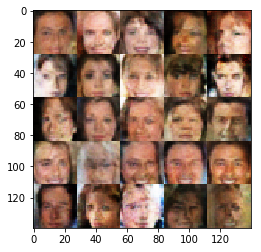

Epoch 1/1   Step 2300	 Discriminator loss: 1.5640	 Generator loss: 2.1943	


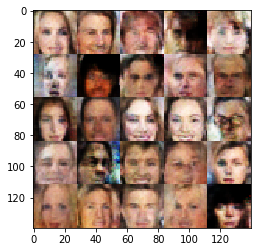

Epoch 1/1   Step 2320	 Discriminator loss: 1.2361	 Generator loss: 0.9870	


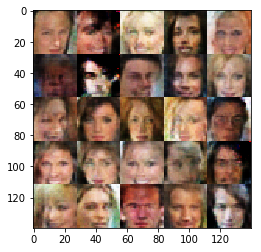

Epoch 1/1   Step 2340	 Discriminator loss: 1.2516	 Generator loss: 0.9663	


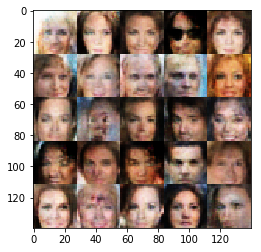

Epoch 1/1   Step 2360	 Discriminator loss: 1.1858	 Generator loss: 1.0066	


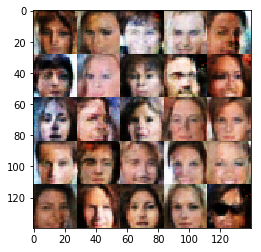

Epoch 1/1   Step 2380	 Discriminator loss: 1.1185	 Generator loss: 0.9620	


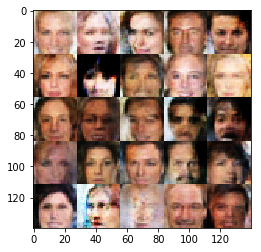

Epoch 1/1   Step 2400	 Discriminator loss: 1.5479	 Generator loss: 0.5249	


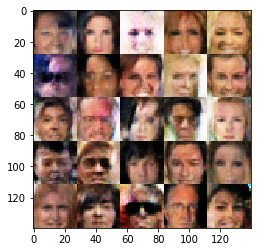

Epoch 1/1   Step 2420	 Discriminator loss: 1.0307	 Generator loss: 1.2645	


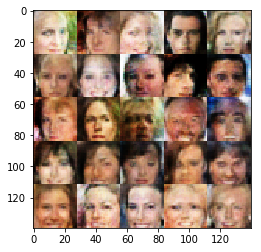

Epoch 1/1   Step 2440	 Discriminator loss: 1.1443	 Generator loss: 1.0317	


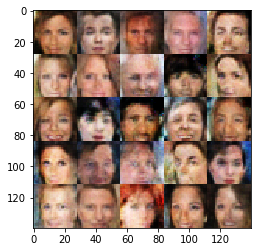

Epoch 1/1   Step 2460	 Discriminator loss: 1.1624	 Generator loss: 0.9022	


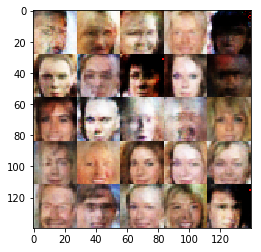

Epoch 1/1   Step 2480	 Discriminator loss: 1.1755	 Generator loss: 1.3844	


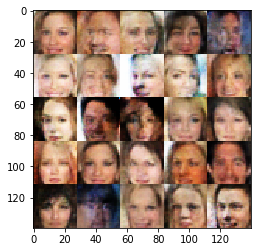

Epoch 1/1   Step 2500	 Discriminator loss: 1.1921	 Generator loss: 0.9074	


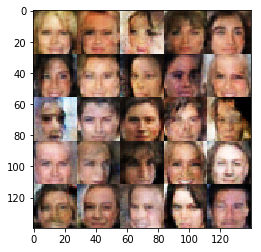

Epoch 1/1   Step 2520	 Discriminator loss: 1.2098	 Generator loss: 0.9238	


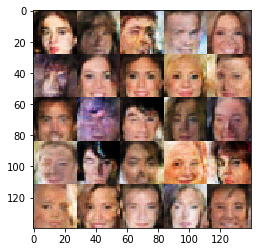

Epoch 1/1   Step 2540	 Discriminator loss: 1.1769	 Generator loss: 1.1359	


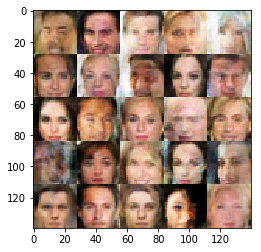

Epoch 1/1   Step 2560	 Discriminator loss: 1.1784	 Generator loss: 1.0275	


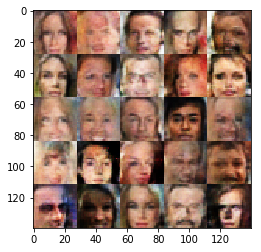

Epoch 1/1   Step 2580	 Discriminator loss: 0.9337	 Generator loss: 1.4409	


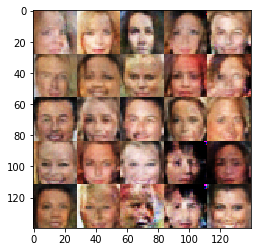

Epoch 1/1   Step 2600	 Discriminator loss: 1.1842	 Generator loss: 0.9094	


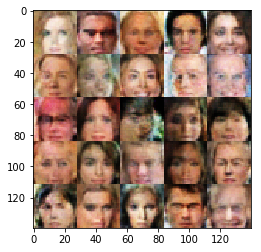

Epoch 1/1   Step 2620	 Discriminator loss: 1.1415	 Generator loss: 1.0088	


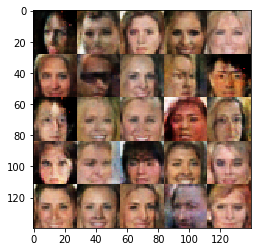

Epoch 1/1   Step 2640	 Discriminator loss: 0.8739	 Generator loss: 1.4891	


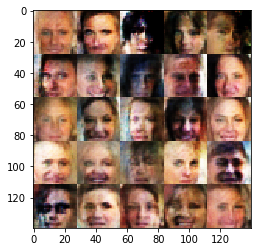

Epoch 1/1   Step 2660	 Discriminator loss: 1.1348	 Generator loss: 0.9582	


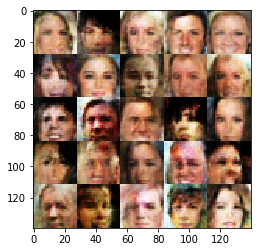

Epoch 1/1   Step 2680	 Discriminator loss: 1.2783	 Generator loss: 2.5497	


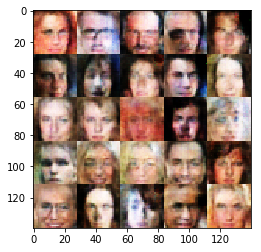

Epoch 1/1   Step 2700	 Discriminator loss: 1.0246	 Generator loss: 1.3421	


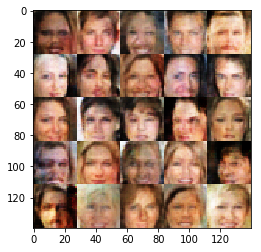

Epoch 1/1   Step 2720	 Discriminator loss: 1.2357	 Generator loss: 0.9601	


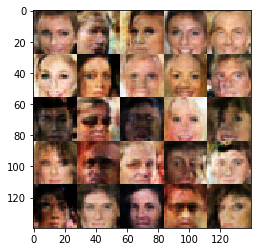

Epoch 1/1   Step 2740	 Discriminator loss: 1.0473	 Generator loss: 1.1456	


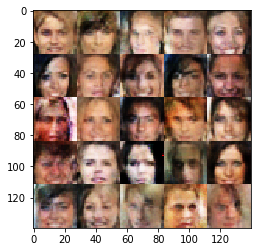

Epoch 1/1   Step 2760	 Discriminator loss: 1.1411	 Generator loss: 0.9504	


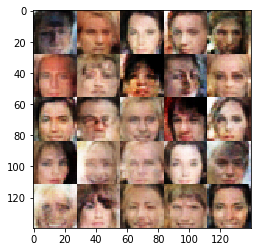

Epoch 1/1   Step 2780	 Discriminator loss: 1.1318	 Generator loss: 0.9908	


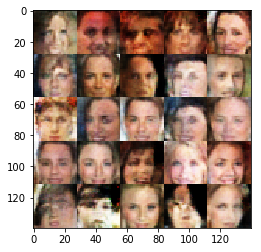

Epoch 1/1   Step 2800	 Discriminator loss: 1.2515	 Generator loss: 1.7838	


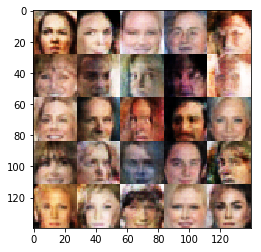

Epoch 1/1   Step 2820	 Discriminator loss: 1.2038	 Generator loss: 0.9984	


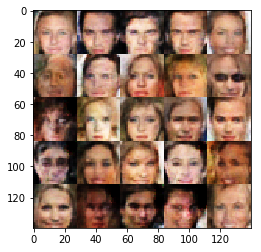

Epoch 1/1   Step 2840	 Discriminator loss: 1.0103	 Generator loss: 1.1158	


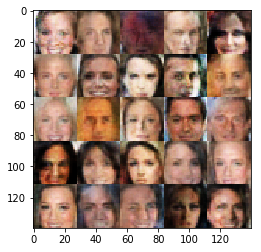

Epoch 1/1   Step 2860	 Discriminator loss: 1.1438	 Generator loss: 0.9792	


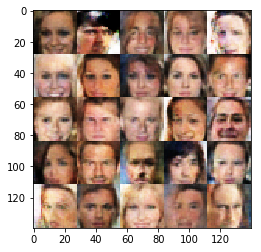

Epoch 1/1   Step 2880	 Discriminator loss: 1.2084	 Generator loss: 0.8373	


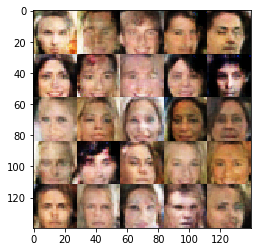

Epoch 1/1   Step 2900	 Discriminator loss: 1.4935	 Generator loss: 0.5794	


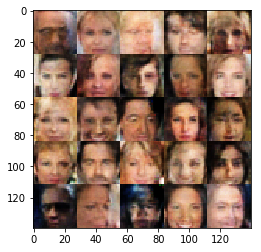

Epoch 1/1   Step 2920	 Discriminator loss: 1.3153	 Generator loss: 2.1747	


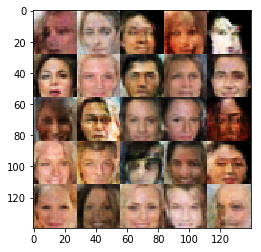

Epoch 1/1   Step 2940	 Discriminator loss: 1.1432	 Generator loss: 1.1392	


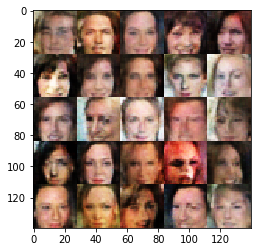

Epoch 1/1   Step 2960	 Discriminator loss: 1.0272	 Generator loss: 1.2917	


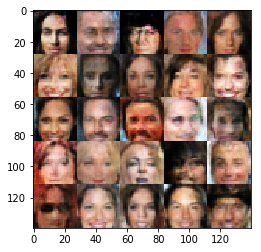

Epoch 1/1   Step 2980	 Discriminator loss: 2.0773	 Generator loss: 1.5781	


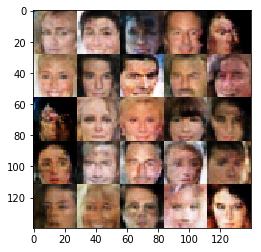

Epoch 1/1   Step 3000	 Discriminator loss: 0.8813	 Generator loss: 2.3793	


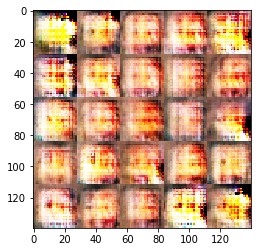

Epoch 1/1   Step 3020	 Discriminator loss: 1.0687	 Generator loss: 1.8844	


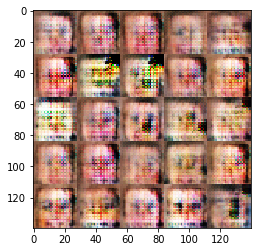

Epoch 1/1   Step 3040	 Discriminator loss: 1.0919	 Generator loss: 1.1633	


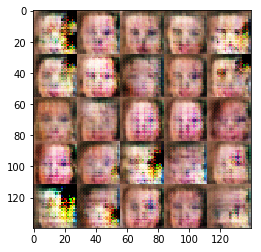

Epoch 1/1   Step 3060	 Discriminator loss: 1.0745	 Generator loss: 1.2956	


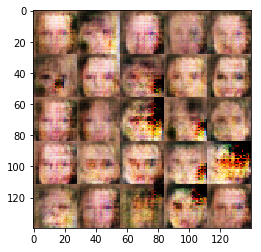

Epoch 1/1   Step 3080	 Discriminator loss: 1.1116	 Generator loss: 1.7624	


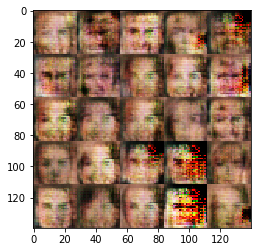

Epoch 1/1   Step 3100	 Discriminator loss: 1.1009	 Generator loss: 2.1596	


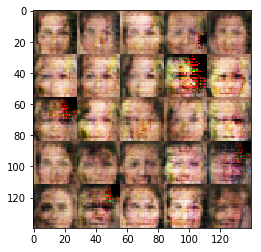

Epoch 1/1   Step 3120	 Discriminator loss: 0.9825	 Generator loss: 1.5350	


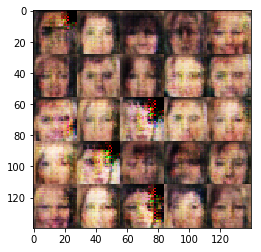

Epoch 1/1   Step 3140	 Discriminator loss: 1.0424	 Generator loss: 1.6397	


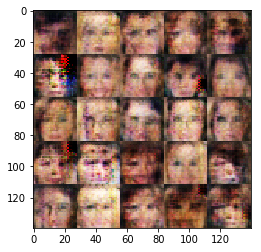

Epoch 1/1   Step 3160	 Discriminator loss: 0.9081	 Generator loss: 1.5475	


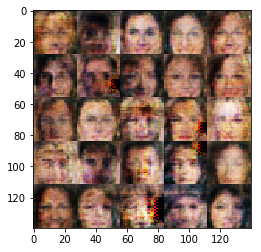

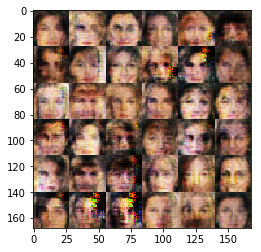

In [69]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.